In [ ]:
import os
import pickle
from tqdm.notebook import tqdm

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add

In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19

In [ ]:
!pip install opendatasets
!pip install pandas

In [ ]:
import opendatasets as od
import pandas

In [ ]:
od.download("https://www.kaggle.com/datasets/sakifhussain/banglalekha-image-dataset")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: sameershafayetlatif
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/sakifhussain/banglalekha-image-dataset


100%|██████████| 6.30G/6.30G [01:24<00:00, 79.6MB/s]


In [ ]:
# od.download("https://www.kaggle.com/datasets/adityajn105/flickr8k/data")

In [ ]:
BASE_DIR = '/content/banglalekha-image-dataset'

In [ ]:
image_path = "/content/banglalekha-image-dataset/images"
jpgs = os.listdir(image_path)
print("Total Images in Dataset = {}".format(len(jpgs)))

Total Images in Dataset = 9154


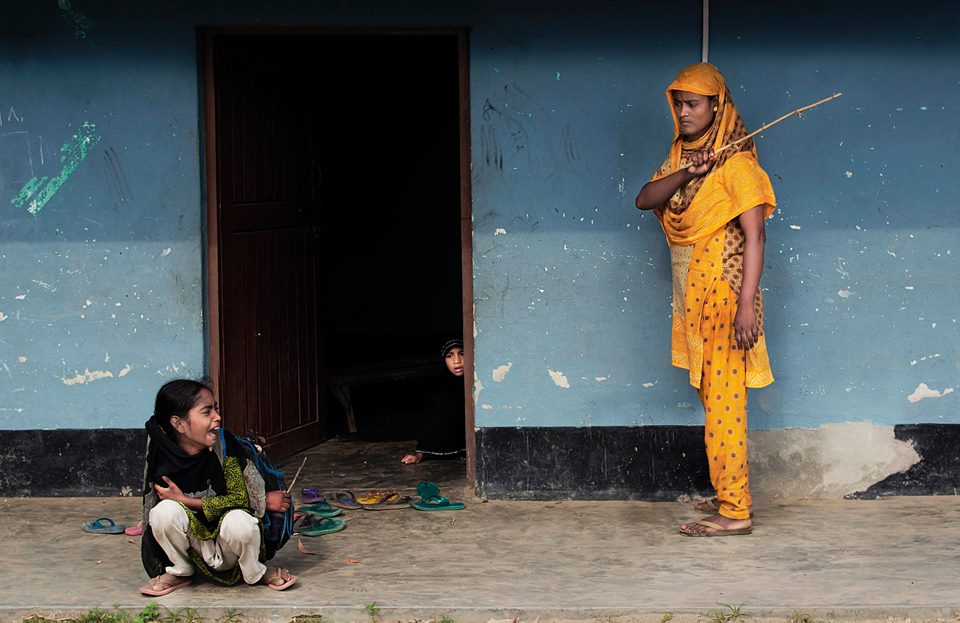

In [ ]:
from IPython.display import Image
Image('/content/banglalekha-image-dataset/images/1.png')

In [ ]:
import pandas as pd
import json

def json_to_csv(json_file, csv_file):
    # Load the JSON data
    with open(json_file, 'r') as f:
        data = json.load(f)

    # Normalize the JSON data into a flat table
    df = pd.json_normalize(data)

    # Save the DataFrame as a CSV file
    df.to_csv(csv_file, index=False)

json_file = 'captions.json'
csv_file = 'BL.csv'

json_to_csv(json_file, csv_file)
print(f"JSON data has been converted to CSV and saved as {csv_file}")

JSON data has been converted to CSV and saved as BL.csv


In [ ]:
image_path = "/content/banglalekha-image-dataset/images"
data = pd.read_csv("/content/BL.csv")
jpgs = os.listdir(image_path)
print("Total Images in Dataset = {}".format(len(jpgs)))
print(type(data))
data

Total Images in Dataset = 9154
<class 'pandas.core.frame.DataFrame'>


,filename,caption
0,1.png,['তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দ...
1,2.png,"['অনেক মেয়ে মানুষ বসে আছে।', 'একটি নীল জামা পর..."
2,3.png,"['অনেক মানুষ একসাথে বসে কাজ করছে।', '২ টি ছোট..."
3,4.png,"['ছয় জন মানুষ দাড়িয়ে আছে।', '৬ জন মানুষ এলোমেল..."
4,5.png,['এক জন মেয়ে মানুষ মাথায় ঘোমটা দিয়ে কাজ করছে। ...
...,...,...
9149,9150.png,"['একজন বৃদ্ধ লোক মাথায় হাত দিয়ে দাঁড়িয়ে আছে।',..."
9150,9151.png,['কয়েকজন ছেলে মেয়ে একসাথে নৌকায় বসে নৌকা বাইচে...
9151,9152.png,['সবুজ ধান ক্ষেতের মধ্যে দিয়ে কয়েকজন ছোট ছেলে ...
9152,9153.png,"['সমুদ্রের মধ্যে একজন লোক জাল ফেলে মাছ ধরছে।',..."


In [ ]:
# load vgg16 model
model = VGG19()
# restructure the model
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)
# summarize
print(model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
# extract features from image
features = {}
directory = os.path.join(BASE_DIR, 'images')

for img_name in tqdm(os.listdir(directory)):
    #load the image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size = (224, 224))
    # convert img pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    feature = model.predict(image, verbose = 0)
    # get image id
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

  0%|          | 0/9154 [00:00<?, ?it/s]

In [ ]:
# WORKING_DIR = '/content/working'
# # store features in pickle
# pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [ ]:
# load features from pickle
# with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
#     features = pickle.load(f)

In [ ]:
CAPTIONS_DIR = '/content'
with open(os.path.join(CAPTIONS_DIR, 'BL.csv'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [ ]:
captions_doc

'1.png,"[\'তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে।\', \'একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে। \']"\n2.png,"[\'অনেক মেয়ে মানুষ বসে আছে।\', \'একটি নীল জামা পরা মহিলা একটি নীল ল্যাপটপ এর দিকে তাকিয়ে আছে এবং পিছনে  তার দিকে বসে শারি পরে তাকিয়ে আছে অনেকগুলো মহিলা। \']"\n3.png,"[\'অনেক মানুষ একসাথে বসে কাজ করছে।\', \'২ টি  ছোট ছেলে একজন শার্ট প্যান্ট  দাড়িয়ে চেয়ে আছে আরেকজন বসে গার্মেন্টস এ কাজ করছে নীল  শার্ট পরে তাদের পিছনে অনেকগুলো মহিলা বসে দাড়িয়ে কাজ করছে।  \']"\n4.png,"[\'ছয় জন মানুষ দাড়িয়ে আছে।\', \'৬ জন মানুষ এলোমেলো দাড়িয়ে আছে, তাদের মাঝে ২ জন ছেলে ৪ জন পুরুষ,  তাদের একজন লুঙ্গী পরে দাড়িয়ে আছে। \']"\n5.png,"[\'এক জন মেয়ে মানুষ মাথায় ঘোমটা দিয়ে কাজ করছে। মাটিতে বিভিন্ন রঙের মসলা আছে।\', \'একটি মহিলা হালকা পানির উপরে দাড়িয়ে আছে শারি পরে, মহিলার মুখ ডানদিকে ঘুরানো, পানির রং হলুদ দেখাচ্ছে। \']"\n6.png,"[\'আবছা অন্ধকারে এক জন মানুষ দাড়িয়ে আছে। পিছনে মানুষ গুলোর চেহারা বোঝা যাচ্ছে না

In [ ]:
# mapping = {}
# #process lines
# for line in tqdm(captions_doc.split(',')):
#     tokens = line.split('\t')
#     image_id = tokens[0].strip()
#     if len(line) < 2:
#         continue
#     caption =  tokens[1:]
#     #remove extensions from image ID
#     image_id = image_id.split('.')[0]
#     # convert caption list to string
#     caption = " ".join(caption)
#     # create list if needed
#     if image_id not in mapping:
#         mapping[image_id] = []
#     #store the caption
#     mapping[image_id].append(caption)

In [ ]:
import re

In [ ]:
# Initialize mapping dictionary
mapping = {}

# Process lines
lines = captions_doc.strip().split('\n')
for line in tqdm(lines):
    # Extract the image file and caption part
    match = re.match(r'(\d+\.png),\s*"(.*)"', line)
    if match:
        image_id = match.group(1).strip().split('.')[0]
        captions = eval(match.group(2))

        # Ensure the mapping dictionary has an entry for the image_id
        if image_id not in mapping:
            mapping[image_id] = []

        # Append each caption to the mapping dictionary
        for caption in captions:
            mapping[image_id].append(caption.strip())

  0%|          | 0/9154 [00:00<?, ?it/s]

In [ ]:
len(mapping)

9154

In [ ]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            #take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # caption = caption.lower()
            # replace digits, special characters
            caption = caption.replace('[^\u0980-\u09FF]', '')
            #delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>0]) + ' endseq'
            captions[i] = caption

In [ ]:
mapping['1']

['তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে।',
 'একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে।']

In [ ]:
# preprocess the text
clean(mapping)

In [ ]:
#after preprocess of text
mapping['1']

['startseq তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে। endseq',
 'startseq একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে। endseq']

In [ ]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [ ]:
len(all_captions)

18308

In [ ]:
all_captions[:10]

['startseq তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে। endseq',
 'startseq একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে। endseq',
 'startseq অনেক মেয়ে মানুষ বসে আছে। endseq',
 'startseq একটি নীল জামা পরা মহিলা একটি নীল ল্যাপটপ এর দিকে তাকিয়ে আছে এবং পিছনে তার দিকে বসে শারি পরে তাকিয়ে আছে অনেকগুলো মহিলা। endseq',
 'startseq অনেক মানুষ একসাথে বসে কাজ করছে। endseq',
 'startseq ২ টি ছোট ছেলে একজন শার্ট প্যান্ট দাড়িয়ে চেয়ে আছে আরেকজন বসে গার্মেন্টস এ কাজ করছে নীল শার্ট পরে তাদের পিছনে অনেকগুলো মহিলা বসে দাড়িয়ে কাজ করছে। endseq',
 'startseq ছয় জন মানুষ দাড়িয়ে আছে। endseq',
 'startseq ৬ জন মানুষ এলোমেলো দাড়িয়ে আছে, তাদের মাঝে ২ জন ছেলে ৪ জন পুরুষ, তাদের একজন লুঙ্গী পরে দাড়িয়ে আছে। endseq',
 'startseq এক জন মেয়ে মানুষ মাথায় ঘোমটা দিয়ে কাজ করছে। মাটিতে বিভিন্ন রঙের মসলা আছে। endseq',
 'startseq একটি মহিলা হালকা পানির উপরে দাড়িয়ে আছে শারি পরে, মহিলার মুখ ডানদিকে ঘুরানো, পানির রং হলুদ দেখাচ্ছে। endseq']

In [ ]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [ ]:
vocab_size

5734

In [ ]:
# get maximum lenth of the caption
max_length = max(len(caption.split()) for caption in all_captions)
max_length

40

In [ ]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
split
train = image_ids[:split]
test = image_ids[split:]

In [ ]:
# create data generator to get data in batch (avoid session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1,X2,y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n +=1
            captions = mapping[key]
            #process each caption
            for caption in captions:
                #encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X,y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq,out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen= max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes = vocab_size)[0]

                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n==batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

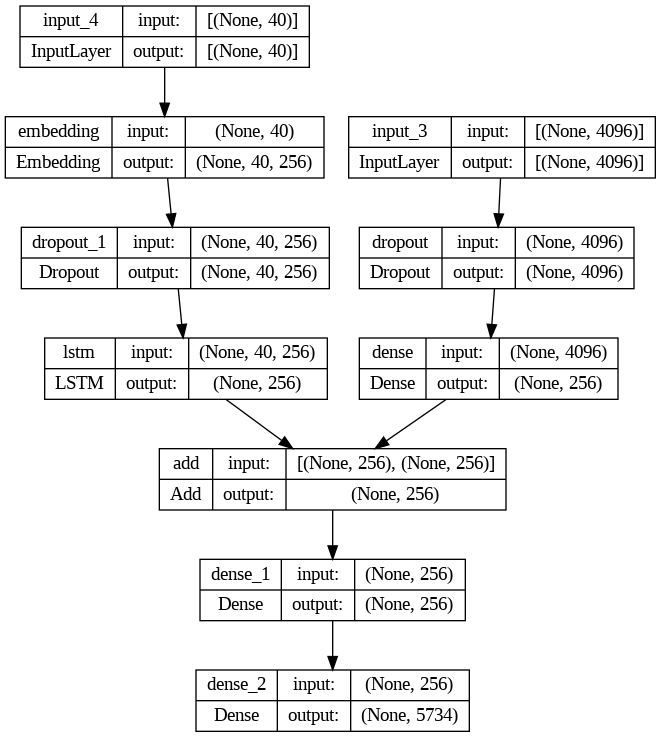

In [ ]:
# image feature layers
inputs1 = Input(shape = (4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation = 'relu')(fe1)
# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero = True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation = 'relu')(decoder1)
outputs = Dense(vocab_size, activation = 'softmax')(decoder2)

model = Model(inputs= [inputs1, inputs2], outputs= outputs)
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam')

#plot the model
plot_model(model, show_shapes= True)

In [ ]:
# train the model
epochs = 15
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    model.fit(generator, epochs=1, steps_per_epoch = steps, verbose = 1)

257/257 [==============================] - 36s 140ms/step - loss: 2.1847


In [ ]:
# save the model
# model.save(WORKING_DIR+'/best_model.h5')

In [ ]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose = 0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        #append word as input for generating next word
        in_text += " "+word
        # stop if we reach end tag
        if word == 'endseq':
            break
    return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu

# validate with text data
actual, predicted = list(), list()
for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# Calculate BLEU score
print("BLEU-1: %f" %corpus_bleu(actual, predicted, weights= (1.0, 0, 0, 0)))
print("BLEU-2: %f" %corpus_bleu(actual, predicted, weights= (0.5, 0.5, 0, 0)))


  0%|          | 0/916 [00:00<?, ?it/s]

BLEU-1: 0.515139
BLEU-2: 0.338329


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------------Actual--------------------------')
    for caption in captions:
        print(caption)
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------------Predicted------------------------')
    print(y_pred)
    plt.imshow(image)

In [ ]:
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 35.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 12.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.1/318.1 kB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.0/145.0 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 7.0 MB

In [ ]:
import gradio as gr
from PIL import Image
import numpy as np

In [ ]:
# Define a function to preprocess the uploaded image
def preprocess_image(image):

    # Convert the image to numpy array
    image = np.array(image)
    # Resize the image to match the expected input size of your model
    # For example, if your model expects images of size (224, 224):
    image = Image.fromarray(image).resize((224, 224))
    # Perform any other preprocessing steps (e.g., normalization)
    # Return the preprocessed image
    return image

In [ ]:

model34 = VGG19()
# restructure the model
model34 = Model(inputs = model34.inputs, outputs = model34.layers[-2].output)

def feature_image(pil_image):

#load the image from file
    # img_path = directory + '/' + img_name
    # image = load_img(img_path, target_size = (224, 224))

    target_size = (224, 224)  # or whatever your model expects
    image = pil_image.resize(target_size)

    # convert img pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = np.expand_dims(image, axis=0)

    # preprocess image for vgg
    feature = model34.predict(image, verbose = 0)
    return feature

In [ ]:
# Define the Gradio interface
inputs = gr.Image(type="pil", label="Upload Image")
outputs = gr.Textbox(label="Generated Caption")

# Define a function to generate a caption for the uploaded image
def generate_caption(image):
    # Preprocess the uploaded image
    features = feature_image(image)
    # Generate a caption for the image using your model
    caption = predict_caption(model, features, tokenizer, max_length)
    # Return the generated caption
    return caption

# Create and launch the Gradio app
gr.Interface(
    fn=generate_caption,
    inputs=inputs,
    outputs=outputs,
    title="Bangla Image Captioning",
    description="Upload an image and get a caption in Bangla!"
).launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://fe995738b84505553c.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


---------------------------Actual--------------------------
startseq অনেক মানুষ একসাথে বসে কাজ করছে। endseq
startseq ২ টি ছোট ছেলে একজন শার্ট প্যান্ট দাড়িয়ে চেয়ে আছে আরেকজন বসে গার্মেন্টস এ কাজ করছে নীল শার্ট পরে তাদের পিছনে অনেকগুলো মহিলা বসে দাড়িয়ে কাজ করছে। endseq
--------------------------Predicted------------------------
startseq একজন নারী ও অনেকগুলো শিশু আছে। endseq


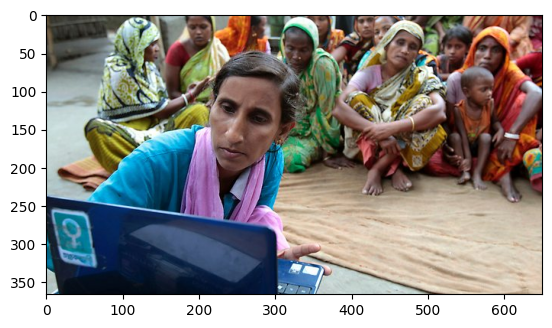

In [ ]:
generate_caption("3.png")

---------------------------Actual--------------------------
startseq খালি গায়ে একটি বাচ্চা ছাতার নিচে বসে কাজ করছে। এখানে অনেক ইটের টুকরা আছে। endseq
startseq একটি বাচ্চা মেয়ে ইটের উপরে বসে ইট ভাংছে তার উপরে একটি ছাতা বাধা পরনে একটি হাফ প্যান্ট । endseq
--------------------------Predicted------------------------
startseq কয়েকজন মানুষ হেঁটে যাচ্ছে। endseq


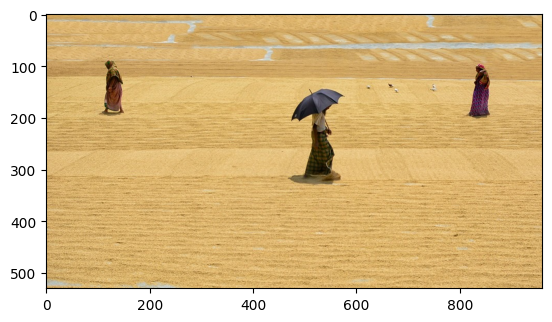

In [ ]:
generate_caption("8.png")

---------------------------Actual--------------------------
startseq তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে। endseq
startseq একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ ও একজন নারী আছে। endseq


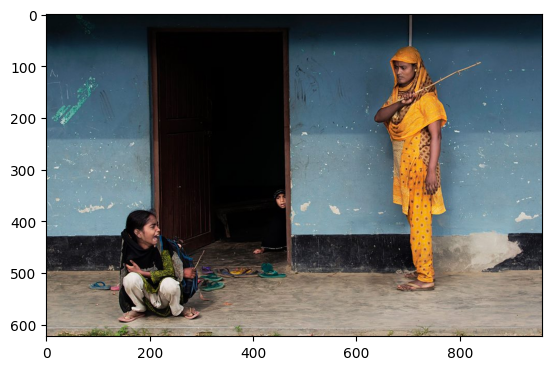

In [ ]:
generate_caption("1.png")

---------------------------Actual--------------------------
startseq অনেক মেয়ে মানুষ বসে আছে। endseq
startseq একটি নীল জামা পরা মহিলা একটি নীল ল্যাপটপ এর দিকে তাকিয়ে আছে এবং পিছনে তার দিকে বসে শারি পরে তাকিয়ে আছে অনেকগুলো মহিলা। endseq
--------------------------Predicted------------------------
startseq একটি নৌকায় কয়েকজন মানুষ আছে। endseq


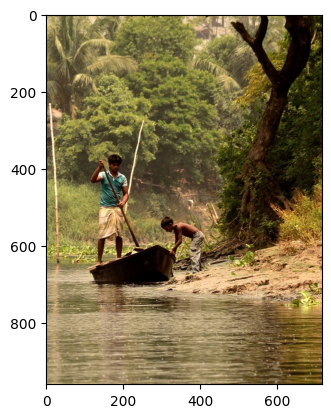

In [ ]:
generate_caption("2.png")

---------------------------Actual--------------------------
startseq দুইজন ছেলে মানুষ আছে। endseq
startseq একজন পুরুষ বসে আছে কালো চাদর পরে আরেকজন পুরুষ একটি খুর হাতে শেভ করছে যার পরনে টি শার্ট। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ ও একজন নারী আছে। endseq


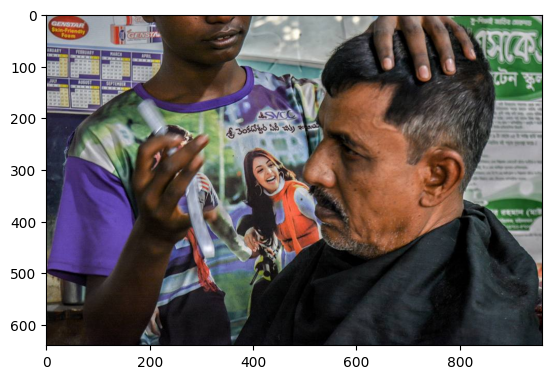

In [ ]:
generate_caption("38.png")

---------------------------Actual--------------------------
startseq দুইজন বালক যাচ্ছে। চারদিকে ফসলের মাঠ। endseq
startseq চারা ধানগাছের ক্ষেতের ছোট রাস্তা দিয়ে ২ টি ছোট ছেলে সাইকেলের টায়ার দিয়ে গাড়ি চালিয়ে যাচ্ছে। endseq
--------------------------Predicted------------------------
startseq একজন নারী ও একটি শিশু আছে। endseq


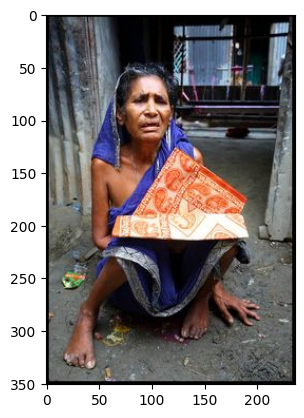

In [ ]:
generate_caption("80.png")

---------------------------Actual--------------------------
startseq অনেকগুলো শিশু হাত তুলে আছে। পিছনে একজন পুরুষ দাড়িয়ে আছে। endseq
startseq একটি ক্লাস এ অনেকগুলো ছোট ছেলেমেয়ে হাত তুলে দাড়িয়ে আছে যাদের অনেকের হাতে বই। endseq
--------------------------Predicted------------------------
startseq কয়েকজন মানুষ আছে। endseq


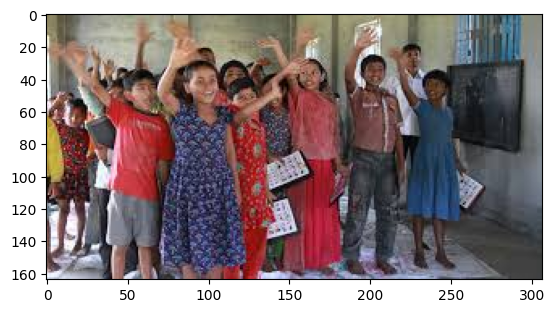

In [ ]:
generate_caption("1783.png")

---------------------------Actual--------------------------
startseq একজন নারী ও একটি শিশু আছে। endseq
startseq একজন মেয়ে বাচ্চা এবং একজন শাড়ি পরা মহিলা একটি লেকের মাঝে একটি নৌকার উপরে দাড়িয়ে আছে। endseq
--------------------------Predicted------------------------
startseq একজন ছোট মেয়ে হাতে একটা জাম্বুরা নিয়ে দাঁড়িয়ে আছে। endseq


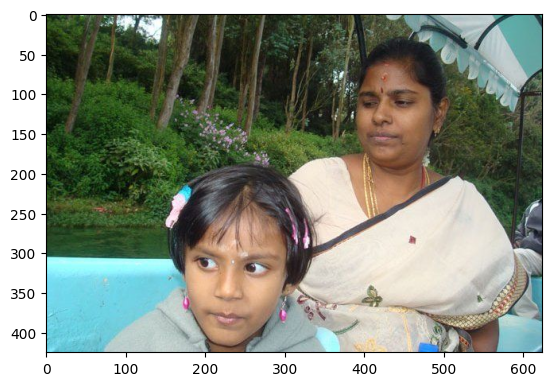

In [ ]:
generate_caption("1784.png")

---------------------------Actual--------------------------
startseq বাড়ির ভিতর কয়েকজন মানুষ আছে। endseq
startseq একটি উঠুনের মাঝে দারিয়ে এবং বসে আছে কিছু নারী পুরুষ এবং বাচ্চা এবং পাশে একটি ছাগল বাধা আছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ হেঁটে যাচ্ছে। endseq


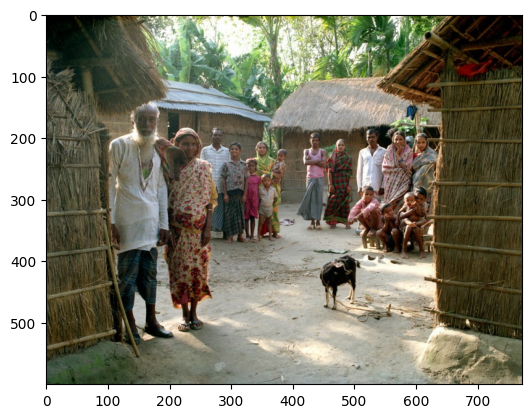

In [ ]:
generate_caption("1830.png")

---------------------------Actual--------------------------
startseq একজন পুরুষ মানুষ মাথায় ইট নিচ্ছে। endseq
startseq একজন ছেলে মানুষ মাথায় ঝুড়ি দিয়ে খুয়া তুলছে। endseq
--------------------------Predicted------------------------
startseq একটি শিশু আছে। endseq


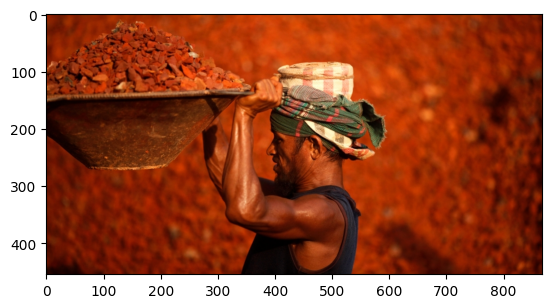

In [ ]:
generate_caption("1000.png")

---------------------------Actual--------------------------
startseq দুইজন কিশোর রেল লাইনের উপর দাঁড়িয়ে হাসছে। endseq
startseq ২ জন ছোট ছেলে রেল লাইন এ দাড়িয়ে আছে যার একজনের মাথায় চুল নেই খালি গা আরেকজন কাঁদে একটি কাঠের ব্যাট নিয়ে খালি গায়ে দাড়িয়ে আছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ ও একজন নারী আছে। endseq


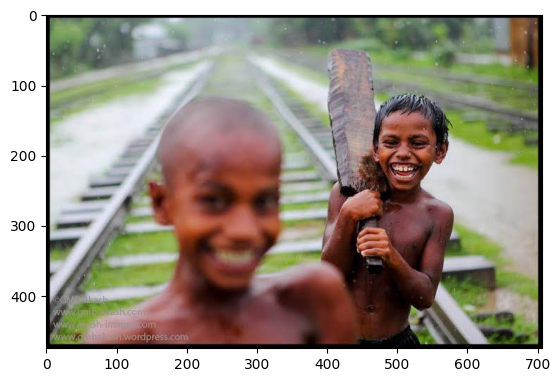

In [ ]:
generate_caption("37.png")

---------------------------Actual--------------------------
startseq আবছা অন্ধকারে এক জন মানুষ দাড়িয়ে আছে। পিছনে মানুষ গুলোর চেহারা বোঝা যাচ্ছে না। endseq
startseq একজন পুরুষ একটি কালো পাঞ্জাবী পায়জামা পরে একটি ঢুল বাজাচ্ছে চুল এলোমেলো করে যার পিছনে কয়েকজন মহিলা , মেয়ে ঝাপসা দেখা যায় দাড়িয়ে আছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ দাড়িয়ে আছে। endseq


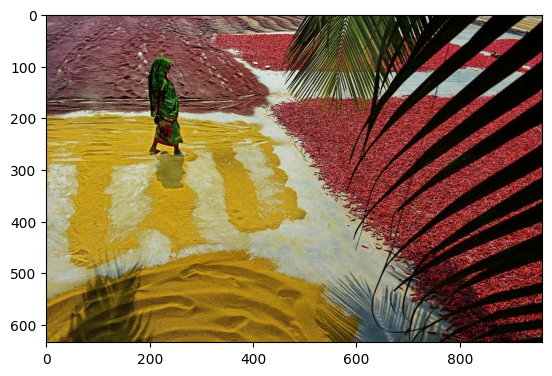

In [ ]:
generate_caption("6.png")

---------------------------Actual--------------------------
startseq একটি মসজিদ আছে। endseq
startseq পুরাতন মসজিদ পাথরের। endseq
--------------------------Predicted------------------------
startseq একটি কারখানায় একজন পাজাবি পরা মহিলা বসে আছে। endseq


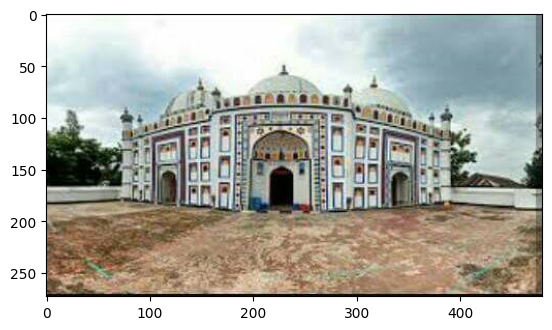

In [ ]:
generate_caption("4664.png")

---------------------------Actual--------------------------
startseq হলুদ জামা পরা একটা মেয়ে পুরানো একটা বারি সিঁড়িতে বসে আছে। endseq
startseq হলুদ জামা পরে একজন নারী বসে আছে। endseq
--------------------------Predicted------------------------
startseq একজন নারী ও একটি শিশু আছে। endseq


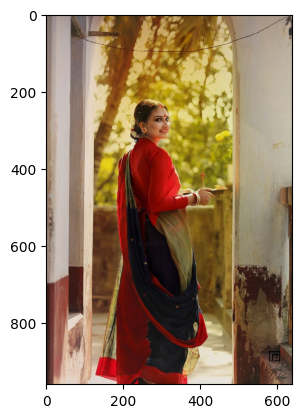

In [ ]:
generate_caption("2446.png")

---------------------------Actual--------------------------
startseq একজন মহিলা লাল শাড়ি পরিধান করে ঘোমটা দিয়ে আছে। endseq
startseq একটি মহিলা লাল শারি গুলাপি ব্রাউস পরে দাড়িয়ে রুদ্রে শুকাতে দেয়া কিছু উল্টাছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ বসে আছে। endseq


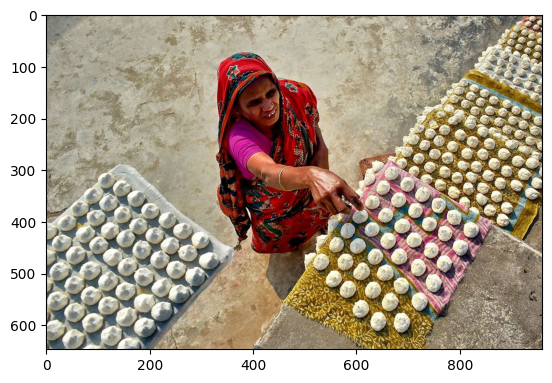

In [ ]:
generate_caption("50.png")

---------------------------Actual--------------------------
startseq "একজন নারী এবং পুরুষ ছবি তুলছে এমন অবস্থায় একজন লোক পেছন থেকে তাদের দেখছে endseq
startseq কিছু দালানের সামনে একটি লোক একজন মহিলার হাত মুখের সামনে ধরে আছে এবং আরেক লোক সেদিকে তাকিয়ে আছে endseq
startseq একটি বহু-সংস্কৃত দম্পতি একটি ছবির জন্য পোজ দিচ্ছেন endseq
startseq man in background watches ." এশিয়ান পুরুষ এবং স্বর্ণকেশী মহিলা বাইরে হাত ধরে আছে এবং পিছনের লোকটি তাদেরকে দেখছে endseq
startseq নীল শার্ট পড়া লোক কালো ডোরাকাটা জ্যাকেটের মহিলা কামরাচ্ছে যখন আরেকজন লোক দেখছে endseq
--------------------------Predicted------------------------
startseq একজন লোক ক্যামেরার জন্য অংগভংগি করছেন endseq


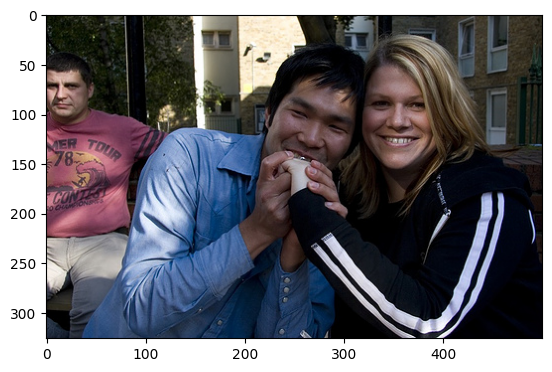

In [ ]:
generate_caption("1042590306_95dea0916c.jpg")


---------------------------Actual--------------------------
startseq অন্ধকারে একজন মানুষ ও একটি শিশু আছে। endseq
startseq ২ জন মানুষ অন্ধকারে দাড়িয়ে আছে যার মাঝে একজন বাচ্চা ছেলে, তাদের পিছনে ২ টি নিশান টাঙ্গানো। endseq
--------------------------Predicted------------------------
startseq একজন নারী ও একটি শিশু আছে। endseq


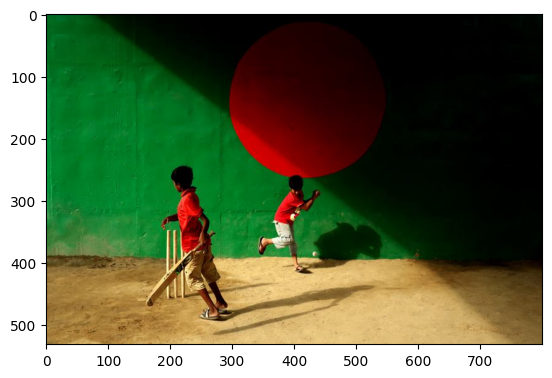

In [ ]:
generate_caption("22.png")

---------------------------Actual--------------------------
startseq একজন নীল পোশাক পরিহিত সোনালী চুলের নারী তার বাহনের জন্য অপেক্ষা করছেন endseq
startseq একজন স্বর্ণকেশী মহিলা রাস্তায় একটি ট্যাক্সি থামানোর চেষ্টা করছেন endseq
startseq as seen from behind ." পেছন থেকে দেখা যাচ্ছে একজন মহিলা ট্র্যাফিক সিগন্যাল দিচ্ছে endseq
startseq একজন স্বর্ণকেশী নীল-টপ পরিহিত মহিলা রাস্তার পাশে হাত নাড়ছেন endseq
startseq নীল পোশাকের মহিলা অগ্রসরমান যানবাহনের প্রতি তার হাতটি ধরে রেখেছেন endseq
--------------------------Predicted------------------------
startseq এক বাচ্চা মেয়ে পানিতে দাঁড়িয়ে আছে endseq


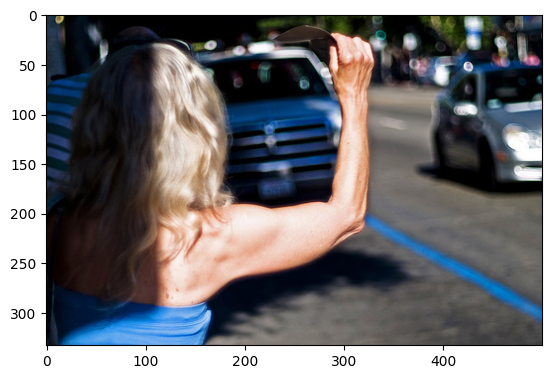

In [ ]:
generate_caption("1056338697_4f7d7ce270.jpg")

---------------------------Actual--------------------------
startseq এক লোক তার নীল ছোটো প্যান্ট পরিধান করে রাস্তায় শুয়ে আছে endseq
startseq নীল ছোটো প্যান্ট পরিহিত লোকটি বাইরে গাড়ি রাখার স্থানে শুয়ে আছে endseq
startseq ভারী যানজটের সময় রাস্তার মাঝখানে এক ব্যাক্তি শুয়ে আছে endseq
startseq বাদামী রঙের এসইউভি এবং একটি খোলা দরজা সহ একটি হলুদ পিকআপের মধ্যকার পার্কিং স্থানে একজন লোক একটি মাদুরের উপর শুয়ে আছে endseq
startseq এক অর্ধনগ্ন লোক একটি ব্যস্ত সড়কের মাঝখানে শুয়ে আছে endseq
--------------------------Predicted------------------------
startseq এক লোক তার গায়ের একটি সড়কের জন্য অপেক্ষা করে endseq


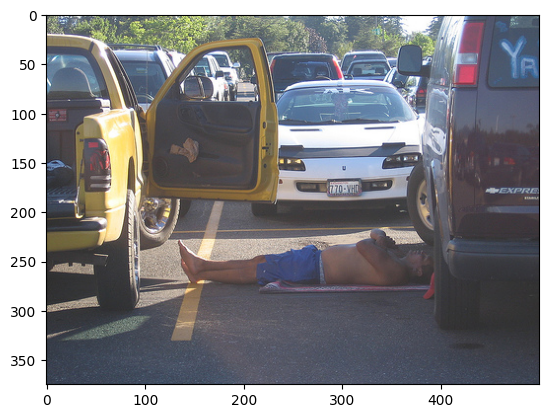

In [ ]:
generate_caption("1067675215_7336a694d6.jpg")


---------------------------Actual--------------------------
startseq আটজন ব্যক্তির একটি দল রাতের বেলায় একটি টেবিলের চতুর্দিকে জড়ো হয়েছে endseq
startseq অন্ধকারে কিছু মানুষ জমায়েত হয়েছে endseq
startseq একদল লোক রাতে বারান্দায় বাইরে একটি টেবিলের চারপাশে বসে endseq
startseq একদল লোক রাতে বাড়ির বাইরে একসাথে বসে আছে endseq
startseq অন্ধকার ঘরে একদল লোক একটি টেবিলে বসে আছে endseq
--------------------------Predicted------------------------
startseq একটি স্কেটপার্কে একটি স্কেটপার্কে একটি ছেলে endseq


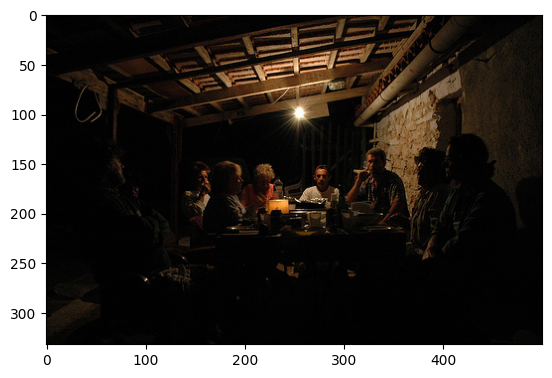

In [ ]:
generate_caption("107582366_d86f2d3347.jpg")


---------------------------Actual--------------------------
startseq সেনালী চুলের একটি ঘোড়া এবং সোনালী চুলের একটি সোয়েটার পরিহিত মেয়ে পিপেতে জ্বলন্ত আগুনের দিকে তাকিয়ে আছে endseq
startseq আগুনের কাছে মেয়েটি তার ঘোড়া নিয়ে দাঁড়িয়ে আছে endseq
startseq একটি মেয়ে আগুনের সামনে ঘোড়ার লাগাম ধরে রেখেছে endseq
startseq and girl and two horses are near contained fire ." "একজন ব্যক্তি একটি মেয়ে এবং দুইটি ঘোড়া আগুনের শিখার কাছে অবস্থান করছে" endseq
startseq দু'জন লোক এবং দুটি ঘোড়া আগুন দেখছে endseq
--------------------------Predicted------------------------
startseq একটি কুকুর ছাগল এবং একটি ঘোড়াকে ধরে endseq


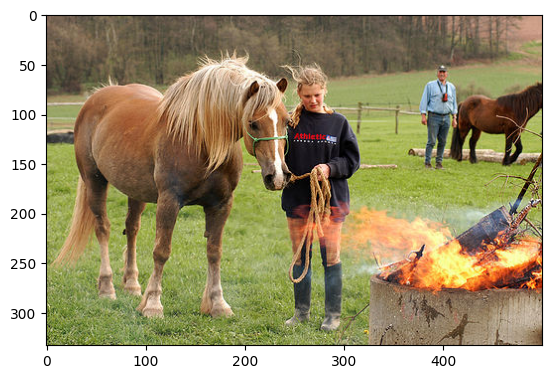

In [ ]:
generate_caption("10815824_2997e03d76.jpg")

---------------------------Actual--------------------------
startseq একটি সাদা কুকুরের কাছ থেকে ধারণকৃত চিত্র- কুকুরটি তার থাবার উপর মাথা রেখে শুয়ে আছে endseq
startseq সাদা বড় কুকুরটি মেঝেতে শুয়ে আছে endseq
startseq একটি সাদা কুকুর তার মাথা মাটিতে লাগিয়ে রয়েছে endseq
startseq একটি সাদা কুকুর চোখ খোলা রেখে টালি-ছাত্তয়া মেঝেতে মাথা নুইয়ে বিশ্রাম নিচ্ছে endseq
startseq একটি সাদা কুকুর বহিঃপ্রাঙ্গনের ইটের উপর মাথা রেখে বিশ্রাম নিচ্ছে endseq
--------------------------Predicted------------------------
startseq একটি সাদা কুকুর বহিঃপ্রাঙ্গনের ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া ছাত্তয়া


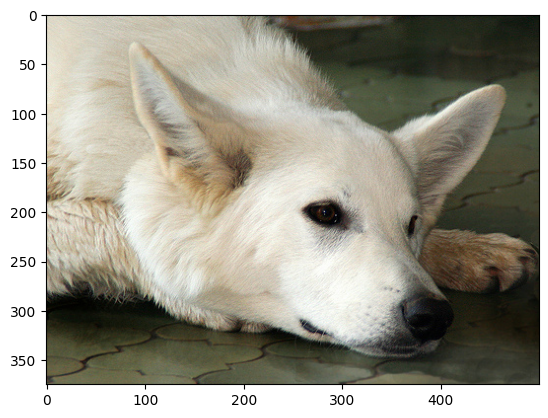

In [ ]:
generate_caption("1084040636_97d9633581.jpg")


---------------------------Actual--------------------------
startseq একটি সুন্দর দিনে একটি পরিবার হালচাষের যন্ত্রের উপর খেলছে endseq
startseq শিশুরা মাঠে হালচাষের যন্ত্র চড়ে বেড়াচ্ছে endseq
startseq বেশ কয়েকটি বাচ্চা বাইরে পোলারিস গাড়িতে খেলছে endseq
startseq চার চাকার গাড়িতে চড়ে শিশুরা খেলা করছে endseq
startseq চারটি বাচ্চা একটি মাঠে চার চাকার গাড়িতে চড়ছে endseq
--------------------------Predicted------------------------
startseq এক বাচ্চা মেয়ে পানিতে খেলছে endseq


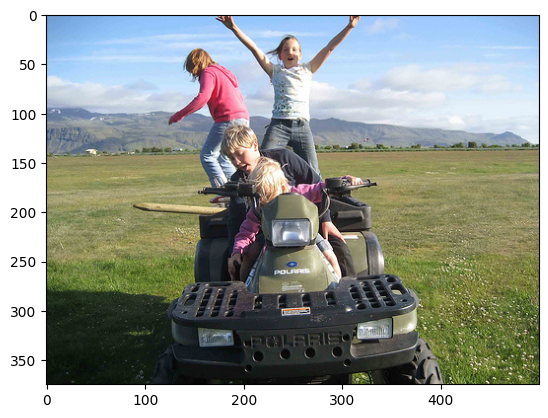

In [ ]:
generate_caption("1087539207_9f77ab3aaf.jpg")


---------------------------Actual--------------------------
startseq একাকী স্কিচালক পাহাড়ের রাস্তা বেয়ে উপরে উঠছে endseq
startseq বরফাবৃত পাহাড় চূড়ায় স্কি চালকেরা দাঁড়িয়ে আছে endseq
startseq বরফের পাহাড়ে আরোহণকারী দুজন হাইকার endseq
startseq তুষার ঢাকা পর্বতের উপর দুইজন ব্যক্তি endseq
startseq জন মানুষ একটি বরফাচ্ছন্ন পর্বত আরোহণ করছেন endseq
--------------------------Predicted------------------------
startseq একটি লোক বরফের উপর দাঁড়িয়ে আছে endseq


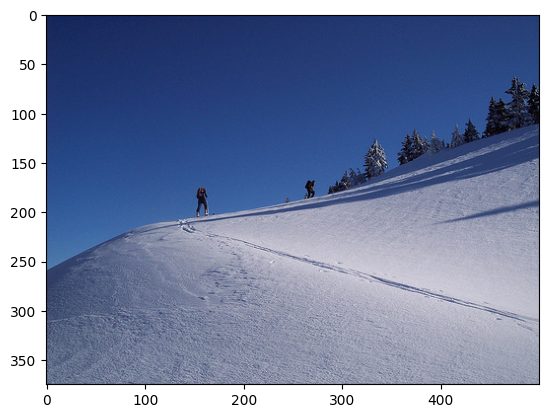

In [ ]:
generate_caption("108899015_bf36131a57.jpg")

---------------------------Actual--------------------------
startseq ডোরাকাটা জামা পরিহিত বালক ঝর্ণার সামনে লাফ দিচ্ছে endseq
startseq একটি পাথরের তৈরী ফোয়ারার সামনে একটি বালক লাফ দিয়ে উঠলো endseq
startseq একজন হাস্যজ্জল বালক শহরের ফোয়ারার সামনে লাফিয়ে খেলা করছে endseq
startseq এক ছোট বালক ফোয়ারার সামনে লাফাচ্ছে endseq
startseq একটি ছোট বালক খেলাচ্ছলে ফোয়ারার পাশে লাফাচ্ছে endseq
--------------------------Predicted------------------------
startseq এক বালক তার স্কেটবোর্ড দিয়ে বাতাসে লাফিয়ে আঘাত করছে endseq


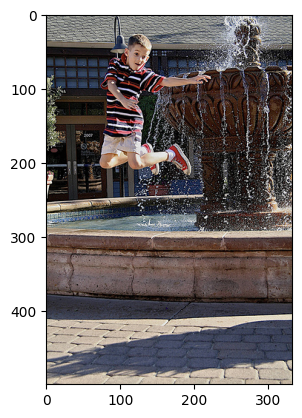

In [ ]:
generate_caption("1100214449_d10861e633.jpg")
